# Imports y Preparacion del dataset

In [281]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
import sklearn.preprocessing as skp
import scipy.stats as stats
import scipy as sc
from sklearn.feature_extraction import FeatureHasher
from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix, classification_report

#joblib
#from joblib import dump, load
import joblib

# multivariado   
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import DistanceMetric

from sklearn import metrics

from sklearn.metrics import precision_score, recall_score, accuracy_score,f1_score#, precision_recall_curve, roc_curve, 




In [282]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [283]:
df = pd.read_csv('/content/drive/MyDrive/Datasets/hotels_train.csv') 
df_test = pd.read_csv('/content/drive/MyDrive/Datasets/hotels_test.csv')
df_test_original = df_test.copy()
df_original = df.copy()


#Preprocesamiento

In [284]:
columnas = {"adr": "average_daily_rate", "arrival_date_year":"year", "arrival_date_month":"month", "arrival_date_day_of_month":"day"} #cambiar nombres a las categorias
df.rename(columns = columnas, inplace = True)
df = df.drop(columns=['arrival_date_week_number'])
#CAMBIO EL UNDEFINED A SC :)
df.loc[df.loc[:,"meal"]=='Undefined',"meal"]="SC"
#COUNTRY
df['country'] = df['country'].fillna("PRT")
paises_comunes = ['PRT','GBR','FRA','ESP','DEU','ITA','IRL', 'BRA', 'BEL', 'USA', 'NLD', 'CHE', 'CN', 'AUT', 'CHN', 'SWE', 'POL', 'RUS', 'ISR', 'NOR']
df.loc[~df.loc[:,"country"].isin(paises_comunes),"country"]="OTHER"
#TENEMOS QUE VER LOS 2 UNDEFINED 
df.drop(df[df['market_segment']=='Undefined'].index, axis='index',inplace=True)
df.drop(df[df['distribution_channel']=='Undefined'].index, axis='index',inplace=True)
#ROOM TYPES
room_type_populares = ["A", "D", "E", "F", "G"]
df.loc[~df.loc[:,"assigned_room_type"].isin(room_type_populares),"assigned_room_type"]="O"
df.loc[~df.loc[:,"reserved_room_type"].isin(room_type_populares),"reserved_room_type"]="O"
#ARRIVAL_DATE
months = {'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 'August':8,'September':9, 'October':10,'November':11, 'December': 12 }
df.month = df.month.map(months)
arrivaldates = df.copy() 

date=arrivaldates.apply(lambda x: datetime.date(int(x['year']), x['month'], x['day']),axis=1)

date = pd.to_datetime(date)

df = df.drop(columns=['year', 'month', 'day'])

df.insert(0, 'arrival_date', date)

#DROP COMPANY
df= df.drop(columns=['company', 'reservation_status_date'])
#CHILDREN
df['children'] = df['children'].fillna(0.0)
df['children'] = df['children'].astype(int)
#AGENT
df['agent'] = df['agent'].fillna(9.0)
df['agent'] = df['agent'].astype(int)

#eliminamos el outlier porque una fila respecto a la gran cantidad de datos que tenemos no es relevante
df.drop(df[df['average_daily_rate']<0].index, axis='index',inplace=True)
df.drop(df[df['average_daily_rate']==0].index, axis='index',inplace=True)
#
df.drop(df[(df['babies']==0) & (df['adults']==0) & (df['children']==0)].index, axis='index',inplace=True)
df.drop(df[(df['babies']==0) & (df['adults']==0) & (df['children']==0)].index, axis='index',inplace=True)
#creamos una nueva col para verificar el tipo de habitacion
df['assigned_equals_reserved'] = np.where(df['assigned_room_type']== df['reserved_room_type'], True, False)
df['assigned_equals_reserved']=df['assigned_equals_reserved'].astype(int)
#TEMPORADA ALTA
temporada_alta = [1,6,7,8,12]
df['temporada_alta'] = pd.DatetimeIndex(df['arrival_date']).month.isin(temporada_alta)
df['temporada_alta'] = df['temporada_alta'] .astype(int)
#DUMMIES
dataset = df.copy()
dataset = pd.get_dummies(dataset, columns=["hotel","meal","deposit_type","customer_type","country"], drop_first=True)
dataset = pd.get_dummies(dataset, columns=["distribution_channel"], drop_first=True)
dataset = pd.get_dummies(dataset, columns=["market_segment"], drop_first=True)

In [285]:
df_test.rename(columns = columnas, inplace = True)
df_test = df_test.drop(columns=['arrival_date_week_number'])
#CAMBIO EL UNDEFINED A SC :)
df_test.loc[df_test.loc[:,"meal"]=='Undefined',"meal"]="SC"
#COUNTRY
df_test['country'] = df_test['country'].fillna("PRT")
df_test.loc[~df_test.loc[:,"country"].isin(paises_comunes),"country"]="OTHER"

#TENEMOS QUE VER LOS 2 UNDEFINED 
df_test.drop(df_test[df_test['market_segment']=='Undefined'].index, axis='index',inplace=True)
df_test.drop(df_test[df_test['distribution_channel']=='Undefined'].index, axis='index',inplace=True)
#ROOM TYPES
df_test.loc[~df_test.loc[:,"assigned_room_type"].isin(room_type_populares),"assigned_room_type"]="O"
df_test.loc[~df_test.loc[:,"reserved_room_type"].isin(room_type_populares),"reserved_room_type"]="O"
#ARRIVAL_DATE
df_test.month = df_test.month.map(months)
arrivaldates = df_test.copy()
date=arrivaldates.apply(lambda x: datetime.date(int(x['year']), x['month'], x['day']),axis=1)
date = pd.to_datetime(date)
df_test = df_test.drop(columns=['year', 'month', 'day'])
df_test.insert(0, 'arrival_date', date)
#DROP COMPANY
df_test= df_test.drop(columns=['company'])

#CHILDREN
df_test['children'] = df_test['children'].fillna(0.0)
df_test['children'] = df_test['children'].astype(int)
#AGENT
df_test['agent'] = df_test['agent'].fillna(9.0)
df_test['agent'] = df_test['agent'].astype(int)

#eliminamos el outlier porque una fila respecto a la gran cantidad de datos que tenemos no es relevante
df_test.drop(df_test[df_test['average_daily_rate']<0].index, axis='index',inplace=True)
df_test.drop(df_test[df_test['average_daily_rate']==0].index, axis='index',inplace=True)
#
df_test.drop(df_test[(df_test['babies']==0) & (df_test['adults']==0) & (df_test['children']==0)].index, axis='index',inplace=True)
df_test.drop(df_test[(df_test['babies']==0) & (df_test['adults']==0) & (df_test['children']==0)].index, axis='index',inplace=True)
#creamos una nueva col para verificar el tipo de habitacion
df_test['assigned_equals_reserved'] = np.where(df_test['assigned_room_type']== df_test['reserved_room_type'], True, False) 
df_test['assigned_equals_reserved']=df_test['assigned_equals_reserved'].astype(int)
#TEMPORADA_ALTA
df_test['temporada_alta'] = pd.DatetimeIndex(df_test['arrival_date']).month.isin(temporada_alta)
df_test['temporada_alta'] = df_test['temporada_alta'] .astype(int)

df_test = pd.get_dummies(df_test, columns=["hotel","meal","deposit_type","customer_type","country"], drop_first=True)
df_test = pd.get_dummies(df_test, columns=["distribution_channel"], drop_first=True)
df_test = pd.get_dummies(df_test, columns=["market_segment"], drop_first=True)


# CHECKPOINT 2


Aca arrancamos con arboles :)


In [286]:
target='is_canceled'

In [287]:
#Verifico balanceo de clases
dataset[target].value_counts(normalize=True)*100

1    50.451558
0    49.548442
Name: is_canceled, dtype: float64

# Arbol de decision N1

In [288]:
features1= ['hotel_Resort Hotel','meal_FB','meal_HB','meal_SC','lead_time', 'adults', 'children', 'babies', 'previous_cancellations','days_in_waiting_list']

In [289]:
#Separo un set de Evaluacion 
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(dataset[features1].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion 

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [290]:
dataset.shape

(61011, 60)

In [291]:
##KFOLD CV Random Search para buscar el mejor arbol 
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 

#Conjunto de parámetros que quiero usar 
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES
               'max_depth':list(range(1,8))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=20 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)  

#Clasificador  
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) 

#Random Search Cross Validation 
randomcv = RandomizedSearchCV(estimator=base_tree, 
                              param_distributions = params_grid,
                              scoring=scorer_fn, 
                              cv=kfoldcv,
                              n_iter=n) 

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train);

In [292]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 3, 'criterion': 'entropy', 'ccp_alpha': 0.0020689655172413794}
0.7084279071017452


In [293]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ 
feat_imps = best_tree.feature_importances_ 

for feat_imp,feat in sorted(zip(feat_imps,features1)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

previous_cancellations: 0.38557516996365687
lead_time: 0.6144248300363431


In [294]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train) 

reglas = export_text(arbol, feature_names=list(features1)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- class: 0
|   |--- lead_time >  7.50
|   |   |--- class: 0
|--- lead_time >  17.50
|   |--- previous_cancellations <= 0.50
|   |   |--- lead_time <= 265.50
|   |   |   |--- class: 1
|   |   |--- lead_time >  265.50
|   |   |   |--- class: 1
|   |--- previous_cancellations >  0.50
|   |   |--- class: 1



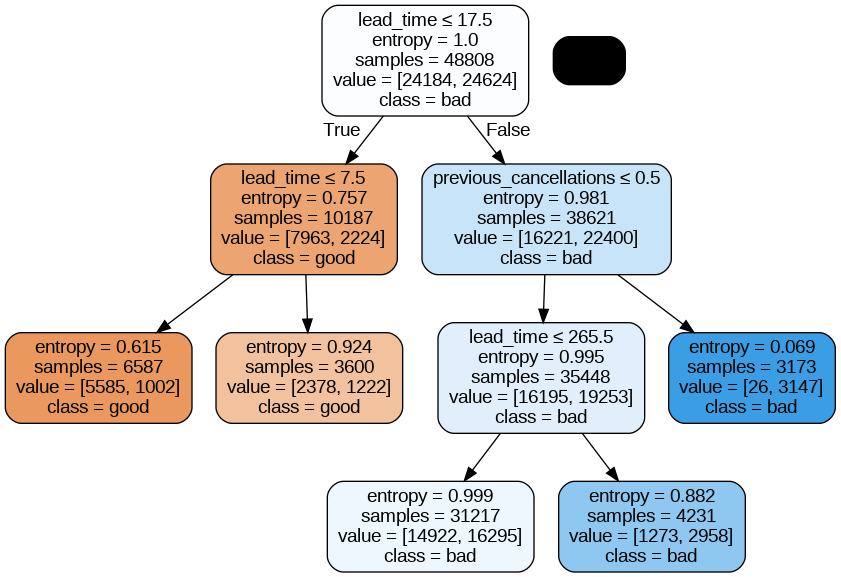

In [295]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features1,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [296]:
#Realizamos una predicción sobre el set de test
y_pred = arbol.predict(x_test)
#Valores Predichos
y_pred

array([1, 1, 1, ..., 1, 0, 1])

In [297]:
print('correctas: ', np.sum(y_test == y_pred))
print('total: ', len(y_test))

correctas:  7587
total:  12203


In [298]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred,)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.621732360894862
Recall: 0.9049861945752802
Precision: 0.580235343121941
f1 score: 0.7071065989847717


In [299]:
joblib.dump(arbol, 'arbol1.pkl')

['arbol1.pkl']

# Arbol de decision N2

In [300]:
features2= ['lead_time','previous_cancellations','booking_changes','previous_bookings_not_canceled', 'stays_in_week_nights','days_in_waiting_list']

In [301]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features2].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [302]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 

#Conjunto de parámetros que quiero usar 
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(1,6))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=45 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n)  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); 

In [303]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 5, 'criterion': 'gini', 'ccp_alpha': 0.0011379310344827587}
0.722022130669416


In [304]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features2)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

stays_in_week_nights: 0.017851475829879632
booking_changes: 0.1576902540438721
previous_cancellations: 0.2602745662416236
lead_time: 0.5641837038846247


# Arbol de decision N3

In [305]:
features3= ['lead_time','previous_cancellations','booking_changes', 'previous_bookings_not_canceled','days_in_waiting_list' ]

In [306]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features3].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [307]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=20 

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(2,12))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=25 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = GridSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_grid = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_jobs=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [308]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #EL ARBOL QUE MEJOR PERFORMO TIENE ESTO, AL SER RANDOM, AL VOLVER A CORRER PUEDE QUE ME DEN OTROS, EN ESTE CASO F1, SI DA MUY BAJO PUEDO MODIFICAR MIS PARAMETRO

{'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 5}
0.7230832395837093


In [309]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features3)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

previous_bookings_not_canceled: 0.04481537762937892
booking_changes: 0.14059615939797654
previous_cancellations: 0.30920369276928744
lead_time: 0.5053847702033573


In [310]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol, feature_names=list(features3)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- booking_changes <= 0.50
|   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |--- previous_bookings_not_canceled <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- previous_bookings_not_canceled >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- previous_cancellations >  0.50
|   |   |   |   |--- previous_bookings_not_canceled <= 2.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- previous_bookings_not_canceled >  2.50
|   |   |   |   |   |--- class: 0
|   |   |--- booking_changes >  0.50
|   |   |   |--- class: 0
|   |--- lead_time >  7.50
|   |   |--- previous_cancellations <= 0.50
|   |   |   |--- class: 0
|   |   |--- previous_cancellations >  0.50
|   |   |   |--- previous_bookings_not_canceled <= 1.50
|   |   |   |   |--- class: 1
|   |   |   |--- previous_bookings_not_canceled >  1.50
|   |   |   |   |--- class: 0
|--- lead_time >  17.50
|   |--- previous_cancellations <= 0.50


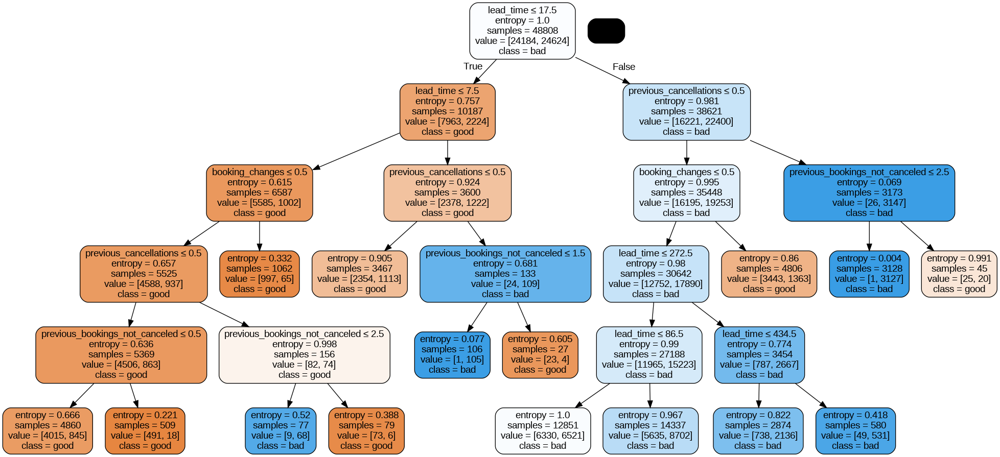

In [311]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features3,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [312]:
df_test.dtypes

arrival_date                      datetime64[ns]
lead_time                                  int64
stays_in_weekend_nights                    int64
stays_in_week_nights                       int64
adults                                     int64
children                                   int64
babies                                     int64
is_repeated_guest                          int64
previous_cancellations                     int64
previous_bookings_not_canceled             int64
reserved_room_type                        object
assigned_room_type                        object
booking_changes                            int64
agent                                      int64
days_in_waiting_list                       int64
average_daily_rate                       float64
required_car_parking_spaces                int64
total_of_special_requests                  int64
reservation_status_date                   object
id                                        object
assigned_equals_rese

In [313]:
prueba = df_test.copy()

In [314]:
filas_totales=df_test.shape[0]
print(df_test.isna().sum()/filas_totales*100) 

arrival_date                      0.0
lead_time                         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
assigned_room_type                0.0
booking_changes                   0.0
agent                             0.0
days_in_waiting_list              0.0
average_daily_rate                0.0
required_car_parking_spaces       0.0
total_of_special_requests         0.0
reservation_status_date           0.0
id                                0.0
assigned_equals_reserved          0.0
temporada_alta                    0.0
hotel_Resort Hotel                0.0
meal_FB                           0.0
meal_HB                           0.0
meal_SC                           0.0
deposit_type

In [315]:
prueba = df_test[['lead_time','previous_cancellations','booking_changes', 'previous_bookings_not_canceled', 'days_in_waiting_list' ]]

In [316]:
y_pred = arbol.predict(x_test)

In [317]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.6742604277636647
Recall: 0.8604840019490011
Precision: 0.6296648443071072
f1 score: 0.7271978587605518


In [318]:
predicciones = arbol.predict(prueba.values)

In [319]:
predicciones

array([1, 1, 0, ..., 1, 1, 1])

In [320]:
predicciones.size

26193

In [321]:
df_test.shape

(26193, 60)

In [322]:
df_test.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status_date', 'id', 'assigned_equals_reserved',
       'temporada_alta', 'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'coun

In [323]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones})
df_submission.head()
df_submission.shape


(26193, 2)

#Arbol de decision N4

In [324]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [325]:
features4= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC']

In [326]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features4].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [327]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(10,18))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [328]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'max_depth': 14, 'criterion': 'gini', 'ccp_alpha': 0.0}
0.7551939195399574


In [329]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features4)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

is_repeated_guest: 0.001245139264837057
babies: 0.0012458572784989131
meal_FB: 0.0037350261889700655
children: 0.004804264921813078
meal_SC: 0.00849223992203442
previous_bookings_not_canceled: 0.009414613941750518
adults: 0.012970843706976418
meal_HB: 0.013106176740063775
hotel_Resort Hotel: 0.01511710831805661
days_in_waiting_list: 0.01559070913997982
stays_in_weekend_nights: 0.01976039973478819
stays_in_week_nights: 0.03784727070730409
required_car_parking_spaces: 0.06495540660038489
previous_cancellations: 0.06734294678695255
booking_changes: 0.09039110996873863
average_daily_rate: 0.1476837829766688
total_of_special_requests: 0.17253654008970395
lead_time: 0.31376056371247824


In [330]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol4 =DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol4.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol4, feature_names=list(features4)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |--- hotel_Resort Hotel <= 0.50
|   |   |   |   |   |   |   |--- average_daily_rate <= 60.69
|   |   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |   |--- meal_SC <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 59.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  59.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- meal_SC >  0.50
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- lead_time >  1.50
|   |   |   |   |   |   |   |   |   |--- average_dail

In [331]:
y_pred = arbol4.predict(x_test)

In [332]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7580922723920347
Recall: 0.7375345135617996
Precision: 0.7726731325506211
f1 score: 0.754695030746219


In [333]:
prueba4 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC']]

In [334]:
predicciones4 = arbol4.predict(prueba4.values)

In [335]:
predicciones4

array([1, 1, 0, ..., 1, 1, 1])

In [336]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones4})
df_submission.head()
df_submission.shape

(26193, 2)

In [337]:
#df_submission.to_csv('/content/submissions/submission_v4.csv', index=False)

In [338]:
joblib.dump(arbol4, 'arbol4.pkl')

['arbol4.pkl']

# Arbol de decision N5

In [339]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [340]:
features5= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC','deposit_type_Non Refund', 'deposit_type_Refundable']

In [341]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features5].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [342]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(10,22))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [343]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 11, 'criterion': 'entropy', 'ccp_alpha': 0.0001724137931034483}
0.7383845804640041


In [344]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features5)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

is_repeated_guest: 0.0006143247303330923
stays_in_weekend_nights: 0.0014431282728378102
stays_in_week_nights: 0.002881704067925746
children: 0.005326669316915421
meal_SC: 0.00537629257772287
days_in_waiting_list: 0.005867546791673451
adults: 0.0072876965819528615
meal_HB: 0.008605339137293179
hotel_Resort Hotel: 0.011734915467963502
previous_bookings_not_canceled: 0.014153874789841652
total_of_special_requests: 0.03565082679956366
booking_changes: 0.03622862258103886
average_daily_rate: 0.06415349361158203
previous_cancellations: 0.06884132196639317
required_car_parking_spaces: 0.10758382189294606
lead_time: 0.12422682420112102
deposit_type_Non Refund: 0.5000235972128956


In [345]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol5=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol5.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol5, feature_names=list(features5)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- required_car_parking_spaces <= 0.50
|   |   |--- lead_time <= 7.50
|   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |--- lead_time <= 0.50
|   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |--- average_daily_rate <= 18.50
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- average_daily_rate >  18.50
|   |   |   |   |   |   |   |--- meal_HB <= 0.50
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 57.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- average_daily_rate >  57.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- meal_HB >  0.50
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 103.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- average_daily_rate >  103.50
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- booking

In [346]:
df_test.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status_date', 'id', 'assigned_equals_reserved',
       'temporada_alta', 'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'coun

In [347]:
y_pred = arbol5.predict(x_test)

In [348]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7590756371384086
Recall: 0.6571382166639598
Precision: 0.8299487179487179
f1 score: 0.733502538071066


In [349]:
prueba5 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable']]

In [350]:
predicciones5 = arbol5.predict(prueba5.values)

In [351]:
predicciones5

array([1, 0, 0, ..., 1, 0, 0])

In [352]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones5})
df_submission.head()
df_submission.shape

(26193, 2)

In [353]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v5.csv', index=False)

In [354]:
joblib.dump(arbol5, 'arbol5.pkl')

['arbol5.pkl']

# Arbol de decision N6

In [355]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [356]:
features6= ['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests']

In [357]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features6].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [358]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [359]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 14, 'criterion': 'entropy', 'ccp_alpha': 0.0}
0.7616574422288069


In [360]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features6)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

hotel_Resort Hotel: 0.011434897953363155
adults: 0.014916157610820288
stays_in_week_nights: 0.024066891580544397
booking_changes: 0.031116712533046022
total_of_special_requests: 0.03848018947589107
previous_cancellations: 0.054361557869901926
required_car_parking_spaces: 0.08232506944688962
assigned_equals_reserved: 0.09756909125411992
average_daily_rate: 0.09892498400401863
lead_time: 0.12859383564061352
deposit_type_Non Refund: 0.41821061263079146


In [361]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol6=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol6.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol6, feature_names=list(features6)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- booking_changes <= 0.50
|   |   |   |   |--- lead_time <= 212.50
|   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |--- adults <= 1.50
|   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 107.10
|   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 105.25
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 34.70
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  34.70
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |--- average_daily_rate >  105.25
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- average_daily_rate >  107.10
|   |   |   |   |   |   |   |   

In [362]:
y_pred = arbol6.predict(x_test)

In [363]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.76391051380808
Recall: 0.7394835146987169
Precision: 0.7809605488850772
f1 score: 0.7596562943188453


In [364]:
prueba6 = df_test[['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests']]

In [365]:
predicciones6 = arbol6.predict(prueba6.values)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.482329 to fit



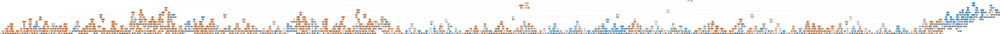

In [366]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol6, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features6,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [367]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones6})
df_submission.head()
df_submission.shape

(26193, 2)

In [368]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v6.csv', index=False)

In [369]:
joblib.dump(arbol6, 'arbol6.pkl')

['arbol6.pkl']

#Arbol de decision N7

In [370]:
features7= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable','assigned_equals_reserved']

In [371]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features7].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [372]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [373]:
#Mejores hiperparametros del arbol
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'max_depth': 10, 'criterion': 'entropy', 'ccp_alpha': 0.0006896551724137932}
0.7452908364764127


In [374]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features7)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

meal_HB: 0.002900044597377851
adults: 0.003402791579325354
children: 0.004367394098006178
meal_SC: 0.005718021810171678
previous_bookings_not_canceled: 0.006606359750301712
hotel_Resort Hotel: 0.012236314304341554
booking_changes: 0.029427049223437893
average_daily_rate: 0.03673561143082949
total_of_special_requests: 0.03701312284422936
previous_cancellations: 0.05969787153555463
lead_time: 0.08164424113116686
required_car_parking_spaces: 0.09913769437528316
assigned_equals_reserved: 0.11749488721008917
deposit_type_Non Refund: 0.503618596109885


In [375]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol7=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol7.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol7, feature_names=list(features7)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- class: 0
|   |   |--- required_car_parking_spaces >  0.50
|   |   |   |--- class: 0
|   |--- assigned_equals_reserved >  0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- lead_time <= 7.50
|   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |--- average_daily_rate <= 24.00
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- average_daily_rate >  24.00
|   |   |   |   |   |   |   |--- lead_time <= 0.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- lead_time >  0.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- booking_changes >  0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_of_special_requests >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--

In [376]:
y_pred = arbol7.predict(x_test)

In [377]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7568630664590674
Recall: 0.7794380380055221
Precision: 0.7489076154806492
f1 score: 0.7638678869876643


In [378]:
prueba7 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable','assigned_equals_reserved']]

In [379]:
predicciones7 = arbol7.predict(prueba7.values)

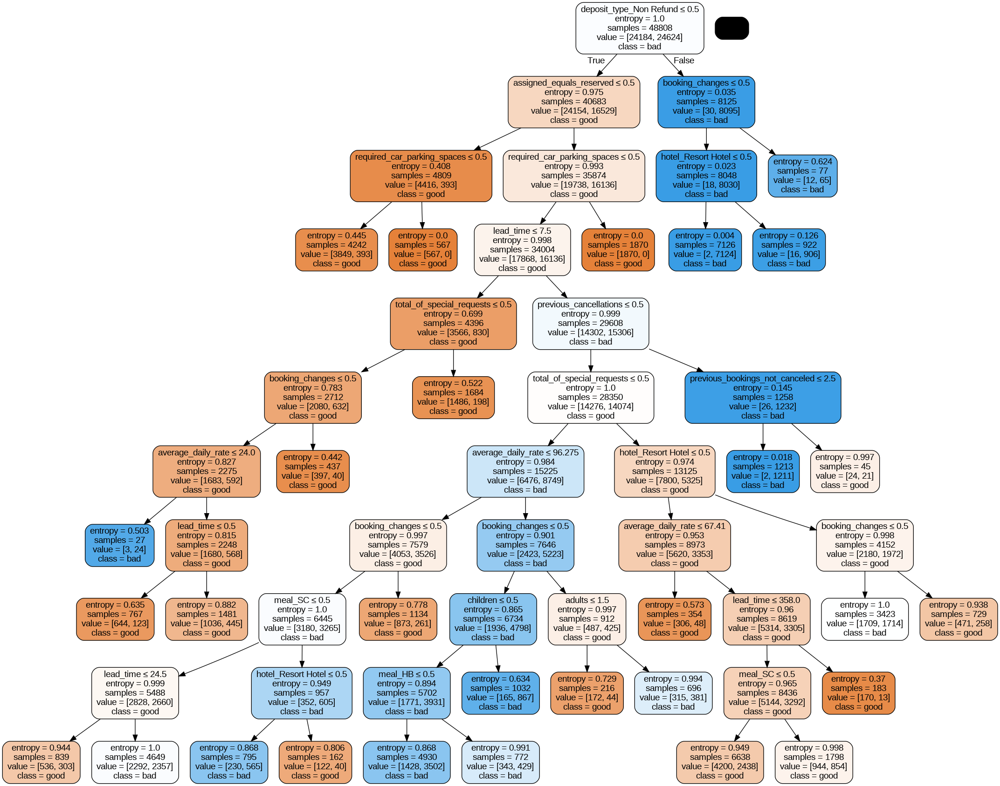

In [380]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol7, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features7,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [381]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones7})
df_submission.head()
df_submission.shape

(26193, 2)

In [382]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v7.csv', index=False)

In [383]:
joblib.dump(arbol7, 'arbol7.pkl')

['arbol7.pkl']

#Arbol de decision N8

In [384]:
features8=['lead_time',
       'stays_in_week_nights', 'adults',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'deposit_type_Non Refund','assigned_equals_reserved', 'temporada_alta']

In [385]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features8].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [386]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [387]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 12, 'criterion': 'entropy', 'ccp_alpha': 0.0}
0.7557920406247747


In [388]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features8)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

temporada_alta: 0.0029133492784565907
days_in_waiting_list: 0.006707064473373851
hotel_Resort Hotel: 0.00915478040325006
adults: 0.010505571480977692
stays_in_week_nights: 0.01124874839873174
previous_bookings_not_canceled: 0.011762705103141317
booking_changes: 0.031173255745030604
total_of_special_requests: 0.03790972855526693
previous_cancellations: 0.05788581379303154
average_daily_rate: 0.06789904668841173
required_car_parking_spaces: 0.08884380280703338
assigned_equals_reserved: 0.10529488965733248
lead_time: 0.10737552412356934
deposit_type_Non Refund: 0.4513257194923928


In [389]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol8=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol8.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol8, feature_names=list(features8)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- booking_changes <= 0.50
|   |   |   |   |--- lead_time <= 212.50
|   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |--- adults <= 1.50
|   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 107.10
|   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 105.25
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 34.70
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  34.70
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- average_daily_rate >  105.25
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- average_daily_rate >  107.10
|   |   |   |   |   |   |   |   

In [390]:
y_pred = arbol8.predict(x_test)

In [391]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7641563549946735
Recall: 0.7695306155595257
Precision: 0.7645634984670001
f1 score: 0.7670390157034158


In [392]:
prueba8 = df_test[['lead_time',
       'stays_in_week_nights', 'adults',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'deposit_type_Non Refund','assigned_equals_reserved', 'temporada_alta']]

In [393]:
predicciones8 = arbol8.predict(prueba8.values)

In [394]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol8, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features8,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.916021 to fit



In [395]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones8})
df_submission.head()
df_submission.shape

(26193, 2)

In [396]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v8.csv', index=False)

In [397]:
joblib.dump(arbol8, 'arbol8.pkl')

['arbol8.pkl']

#Arbol de decision N9

In [398]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [399]:
features9= ['deposit_type_Non Refund','lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 
'required_car_parking_spaces','booking_changes','stays_in_week_nights','adults','hotel_Resort Hotel','total_of_special_requests',
'customer_type_Group', 'customer_type_Transient','customer_type_Transient-Party','country_PRT', 'country_GBR',
'country_FRA','country_ESP','country_DEU', 'distribution_channel_TA/TO','market_segment_Offline TA/TO', 'market_segment_Online TA']

In [400]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features9].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [401]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(15,24))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [402]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 19, 'criterion': 'entropy', 'ccp_alpha': 0.001413793103448276}
0.8156934344775578


In [403]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features9)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

hotel_Resort Hotel: 0.003666149316083776
stays_in_week_nights: 0.004641062585653484
customer_type_Transient-Party: 0.004886734186135156
booking_changes: 0.00719708248096063
average_daily_rate: 0.015552621370655117
distribution_channel_TA/TO: 0.01788187662190227
customer_type_Transient: 0.023607905980343305
previous_cancellations: 0.031059360944321525
total_of_special_requests: 0.05753108334312434
lead_time: 0.06719665509131005
required_car_parking_spaces: 0.07547429120763212
country_PRT: 0.07930524833066085
assigned_equals_reserved: 0.08947389686952166
market_segment_Online TA: 0.1390138687182782
deposit_type_Non Refund: 0.3835121629534175


In [404]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol9=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol9.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol9, feature_names=list(features9)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- country_PRT <= 0.50
|   |   |   |--- class: 0
|   |   |--- country_PRT >  0.50
|   |   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- required_car_parking_spaces >  0.50
|   |   |   |   |--- class: 0
|   |--- assigned_equals_reserved >  0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- lead_time <= 7.50
|   |   |   |   |--- country_PRT <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- country_PRT >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- lead_time >  7.50
|   |   |   |   |--- country_PRT <= 0.50
|   |   |   |   |   |--- market_segment_Online TA <= 0.50
|   |   |   |   |   |   |--- distribution_channel_TA/TO <= 0.50
|   |   |   |   |   |   |   |--- customer_type_Transient <= 0.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- customer_type_Transient >  0.50
|   |   |   |

In [405]:
y_pred = arbol9.predict(x_test)

In [406]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.8141440629353438
Recall: 0.7834984570407666
Precision: 0.8376454245528737
f1 score: 0.8096676737160121


In [407]:
prueba9 = df_test[['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests','customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party','country_PRT', 'country_GBR','country_FRA','country_ESP','country_DEU', 'distribution_channel_TA/TO','market_segment_Offline TA/TO', 'market_segment_Online TA']]

In [408]:
predicciones9 = arbol9.predict(prueba9.values)

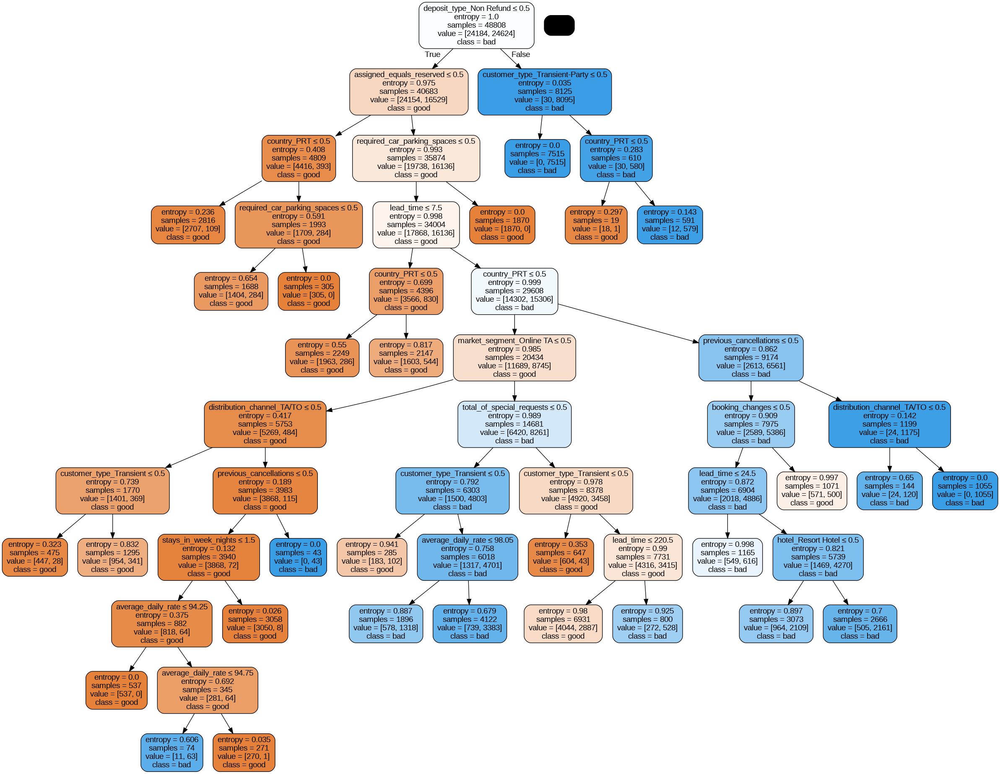

In [409]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol9, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features9,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [410]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones9})
df_submission.head()
df_submission.shape

(26193, 2)

In [411]:
#df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v10.csv', index=False)

# Matriz de Confusion

In [412]:
y_pred = arbol9.predict(x_test)

Text(50.722222222222214, 0.5, 'True')

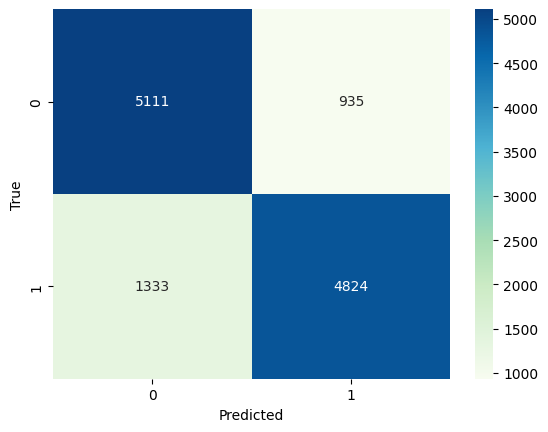

In [413]:
#Creo la matriz de confusión
tabla=confusion_matrix(y_test, y_pred)

#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

# Performance

In [414]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.8141440629353438
Recall: 0.7834984570407666
Precision: 0.8376454245528737
f1 score: 0.8096676737160121


In [415]:
joblib.dump(arbol9, 'arbol9.pkl')

['arbol9.pkl']